<a href="https://colab.research.google.com/github/dstephenhaynes/DTSA5510/blob/main/DTSA5510_Final_v3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

### <center>
<h1><center>Movie Genre Dialogue Analysis</center></h1>
<h2><center>Unsupervised Algorithms in Machine Learning</center></h2>
<h3><center>
DTSA-5510

University of Colorado Boulder

D. Stephen Haynes
</center></h3>



# Movie Genere Dialogue Analysis
- This project will use Unsupervised Learning methods on a dataset containing partial dialogue from over 600 movies. These methods will be used to classify the movie genres based on their dialogues.
- The code below will do the following:
  - Ingest the datasets, convert the text from each entry into dataframes, and then clean the data
  - Convert the texts into feature vectors
  - Apply Principal Component Analysis (PCA) to reduce the dimensionality of the feature space
  - Apply clustering methods to the reduced feature space
  - Measure clustering metrics with silhouette score
  - Provide visuals to analyze the clustering
  - Validate the clustering performance
  - Tune hyperparameters to discover performance enhancement opportunities
  - Present final results and evaluation

## The Dataset
- The dataset for this project is the Cornell Movie-Dialog Corpus, created by Rajath Chindananda, and available on Kaggle here:
  https://www.kaggle.com/datasets/rajathmc/cornell-moviedialog-corpus
- The dataset contains portions of dialogue from over 600 movies
- There are over 304,000 lines of dialogue that combine to 4.8 Million words
- The data is split into multiple files, of which two are pertinent to this project
  - movie_lines.txt: This file is the dialogue texts with movie ID labels - it has been split into two files due to github file size limits
  - movie_titles_metadata.txt: This file lists the movie titles, movie ID labels, and film genres

To start, we'll import the required libraries and ingest the data, which has been copied to my github repository for simplicity.

In [1]:
# Import necessary libraries
import os
import re
import string
import requests
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.sparse import hstack
import seaborn as sns

# NLTK libraries
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer

# Sklearn libraries
from sklearn.cluster import KMeans, DBSCAN
from sklearn.decomposition import PCA
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics import silhouette_score, davies_bouldin_score, adjusted_rand_score, make_scorer
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.neighbors import NearestNeighbors
from sklearn.preprocessing import MultiLabelBinarizer

# Visualization libraries
from wordcloud import WordCloud

# Gensim libraries
from gensim.models import Word2Vec

# Ensure nltk data is downloaded
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...


True

In [2]:
# Define URLs of the files
metadata_url = 'https://raw.githubusercontent.com/dstephenhaynes/DTSA5510/main/movie_titles_metadata.txt'
dialogue_urls = [
    'https://raw.githubusercontent.com/dstephenhaynes/DTSA5510/main/movie_lines_1.txt',
    'https://raw.githubusercontent.com/dstephenhaynes/DTSA5510/main/movie_lines_2.txt'
]

# Load movie metadata
response = requests.get(metadata_url)
data = response.text
columns = ['movie_id', 'movie_title', 'movie_year', 'imdb_rating', 'imdb_id', 'genres']
rows = []

for line in data.splitlines():
    fields = line.strip().split(' +++$+++ ')
    fields[-1] = eval(fields[-1])
    rows.append(fields)

movies = pd.DataFrame(rows, columns=columns)

# Load dialogues
dialogue_rows = []
dialogue_columns = ['line_id', 'character_id', 'movie_id', 'character_name', 'dialogue']

for url in dialogue_urls:
    response = requests.get(url)
    data = response.text
    for line in data.splitlines():
        fields = line.strip().split(' +++$+++ ')
        dialogue_rows.append(fields)

dialogue = pd.DataFrame(dialogue_rows, columns=dialogue_columns)

print(movies.head())
print(dialogue.head())


  movie_id                 movie_title movie_year imdb_rating imdb_id  \
0       m0  10 things i hate about you       1999        6.90   62847   
1       m1  1492: conquest of paradise       1992        6.20   10421   
2       m2                  15 minutes       2001        6.10   25854   
3       m3       2001: a space odyssey       1968        8.40  163227   
4       m4                     48 hrs.       1982        6.90   22289   

                                     genres  
0                         [comedy, romance]  
1    [adventure, biography, drama, history]  
2          [action, crime, drama, thriller]  
3              [adventure, mystery, sci-fi]  
4  [action, comedy, crime, drama, thriller]  
  line_id character_id movie_id character_name      dialogue
0   L1045           u0       m0         BIANCA  They do not!
1   L1044           u2       m0        CAMERON   They do to!
2    L985           u0       m0         BIANCA    I hope so.
3    L984           u2       m0        CA

# Data Cleaning

We need to determine if there are any missing or otherwise troublesome entries in the data. The code below will:
- Determine if there are any missing or null values present
- Using the stopwords library, clear out insignificant words and punctuation
- Visualize the distribution of movie genres and dialogue lengths in the datasets.
- Evaluate the most frequent words to determine if the remaining dialogue text can be used for genre classification.

In [3]:
# Remove null values
dialogue.dropna(subset=['dialogue'], inplace=True)

# Normalize text: convert to lowercase, remove punctuation
def normalize_text(text):
    text = text.lower()  # Lowercase
    text = re.sub(f"[{re.escape(string.punctuation)}]", "", text)  # Remove punctuation
    return text

dialogue['clean_dialogue'] = dialogue['dialogue'].apply(normalize_text)

# Remove stop words, tokenize, and lemmatize
stop_words = set(stopwords.words('english'))
lemmatizer = WordNetLemmatizer()

def preprocess_text(text):
    words = word_tokenize(text)
    words = [lemmatizer.lemmatize(word) for word in words if word not in stop_words]
    return ' '.join(words)

dialogue['processed_dialogue'] = dialogue['clean_dialogue'].apply(preprocess_text)

print(dialogue[['dialogue', 'clean_dialogue', 'processed_dialogue']].head())


       dialogue clean_dialogue processed_dialogue
0  They do not!    they do not                   
1   They do to!     they do to                   
2    I hope so.      i hope so               hope
3     She okay?       she okay               okay
4     Let's go.        lets go             let go


In [4]:
# Merge dialogues based on movie_id
movie_dialogues = dialogue.groupby('movie_id')['processed_dialogue'].apply(lambda x: ' '.join(x)).reset_index()

# Merge with movie metadata
merged_data = pd.merge(movies, movie_dialogues, on='movie_id', how='inner')


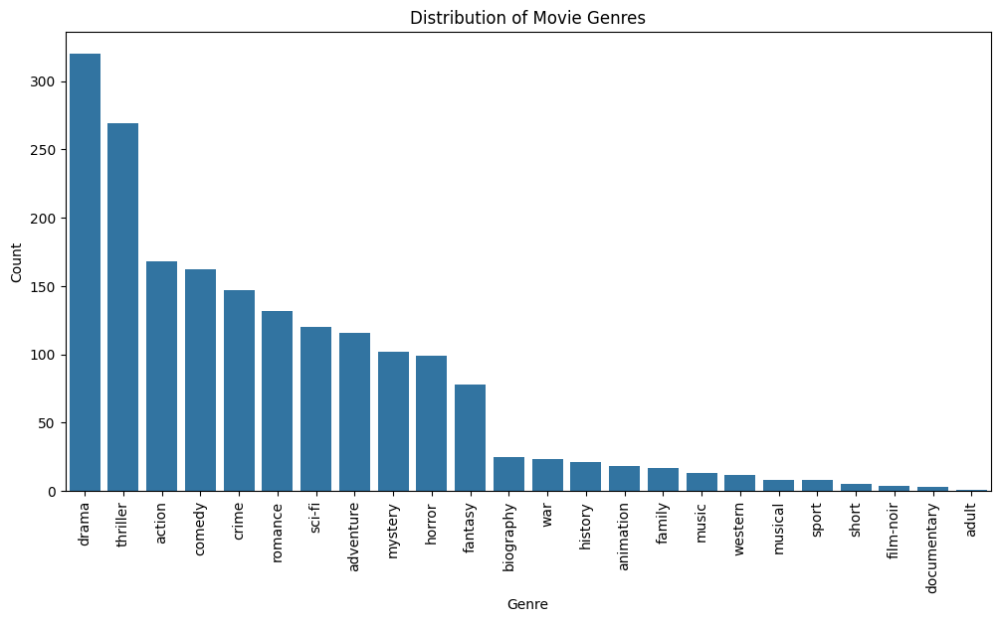

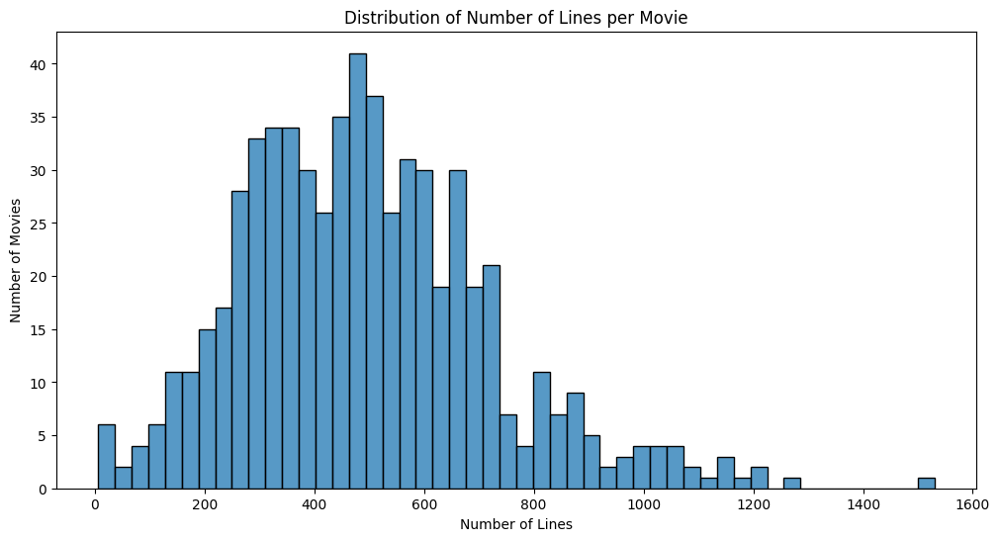

In [5]:
# Display the distribution of genres
all_genres = [genre for sublist in movies['genres'] for genre in sublist]
genre_counts = pd.Series(all_genres).value_counts()

plt.figure(figsize=(12, 6))
sns.barplot(x=genre_counts.index, y=genre_counts.values)
plt.title('Distribution of Movie Genres')
plt.xlabel('Genre')
plt.ylabel('Count')
plt.xticks(rotation=90)
plt.show()

# Display the number of lines per movie
dialogues_per_movie = dialogue['movie_id'].value_counts()

plt.figure(figsize=(12, 6))
sns.histplot(dialogues_per_movie, bins=50)
plt.title('Distribution of Number of Lines per Movie')
plt.xlabel('Number of Lines')
plt.ylabel('Number of Movies')
plt.show()

In [6]:
# Calculate the number of words in each dialogue
merged_data['word_count'] = merged_data['processed_dialogue'].apply(lambda x: len(x.split()))

In [7]:
# Explode genres so each row contains one genre
exploded_genres = merged_data.explode('genres')

exploded_genres.head()

,movie_id,movie_title,movie_year,imdb_rating,imdb_id,genres,processed_dialogue,word_count
0,m0,10 things i hate about you,1999,6.90,62847,comedy,hope okay let go wow okay youre gon na need ...,2716
0,m0,10 things i hate about you,1999,6.90,62847,romance,hope okay let go wow okay youre gon na need ...,2716
1,m1,1492: conquest of paradise,1992,6.20,10421,adventure,cant far say also dont like smell sea around s...,1213
1,m1,1492: conquest of paradise,1992,6.20,10421,biography,cant far say also dont like smell sea around s...,1213
1,m1,1492: conquest of paradise,1992,6.20,10421,drama,cant far say also dont like smell sea around s...,1213


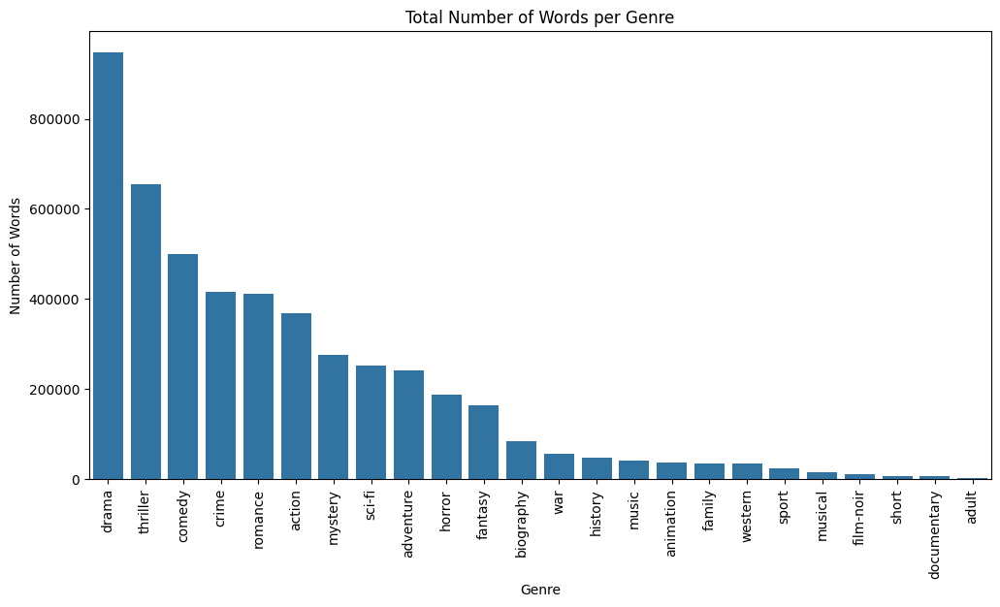

In [8]:
# Count number of words per genre
dialogues_per_genre = exploded_genres.groupby('genres')['word_count'].sum().reset_index()

# Plot the number of words per genre
plt.figure(figsize=(12, 6))
sns.barplot(x='genres', y='word_count', data=dialogues_per_genre.sort_values(by='word_count', ascending=False))
plt.title('Total Number of Words per Genre')
plt.xlabel('Genre')
plt.ylabel('Number of Words')
plt.xticks(rotation=90)
plt.show()


         genres  total_word_count  dialogue_count  average_word_count
4     biography             84135              25         3365.400000
14        music             41804              13         3215.692308
17      romance            410579             132         3110.446970
5        comedy            499783             162         3085.080247
20        sport             24676               8         3084.500000
8         drama            947516             320         2960.987500
23      western             35105              12         2925.416667
6         crime            416352             147         2832.326531
11    film-noir             10886               4         2721.500000
16      mystery            275079             102         2696.852941
22          war             56559              23         2459.086957
21     thriller            654529             269         2433.193309
7   documentary              7056               3         2352.000000
12      history     

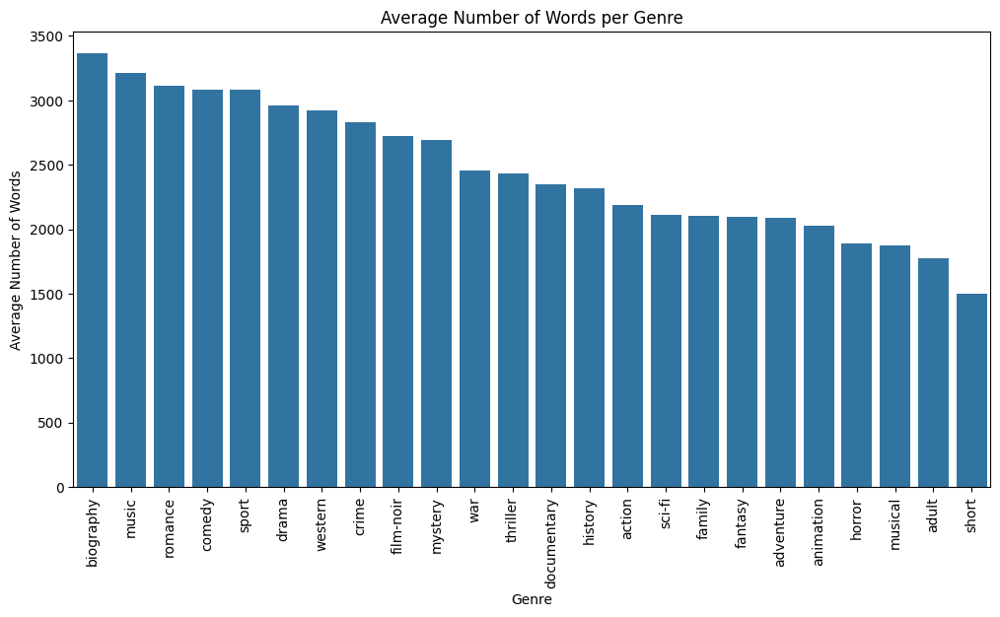

In [9]:
# Count the number of dialogues per genre
dialogue_count_per_genre = exploded_genres.groupby('genres').size().reset_index(name='dialogue_count')

# Calculate the total word count per genre
total_word_count_per_genre = exploded_genres.groupby('genres')['word_count'].sum().reset_index(name='total_word_count')

# Merge the counts and calculate the average word count per dialogue for each genre
average_words_per_genre = pd.merge(total_word_count_per_genre, dialogue_count_per_genre, on='genres')
average_words_per_genre['average_word_count'] = average_words_per_genre['total_word_count'] / average_words_per_genre['dialogue_count']

# Display the dataframe
print(average_words_per_genre.sort_values(by='average_word_count', ascending=False))

# Plot the number of words per genre
plt.figure(figsize=(12, 6))
sns.barplot(x='genres', y='average_word_count', data=average_words_per_genre.sort_values(by='average_word_count', ascending=False))
plt.title('Average Number of Words per Genre')
plt.xlabel('Genre')
plt.ylabel('Average Number of Words')
plt.xticks(rotation=90)
plt.show()


In [10]:
# Create simplified dataframe combining all dialogue by genre
genre_dialogues = exploded_genres.groupby('genres')['processed_dialogue'].apply(lambda x: ' '.join(x)).reset_index()
genre_dialogues.head(25)

,genres,processed_dialogue
0,action,officer there killer duty arrest kill someone ...
1,adult,im gon na tv like diane sawyer baby going nati...
2,adventure,cant far say also dont like smell sea around s...
3,animation,whats matter dear uuuuuuugh hey sweetheart cut...
4,biography,cant far say also dont like smell sea around s...
5,comedy,hope okay let go wow okay youre gon na need ...
6,crime,officer there killer duty arrest kill someone ...
7,documentary,oh goingaway gesture little goingaway gesture ...
8,drama,cant far say also dont like smell sea around s...
9,family,impact eight second cant break free get ivan c...


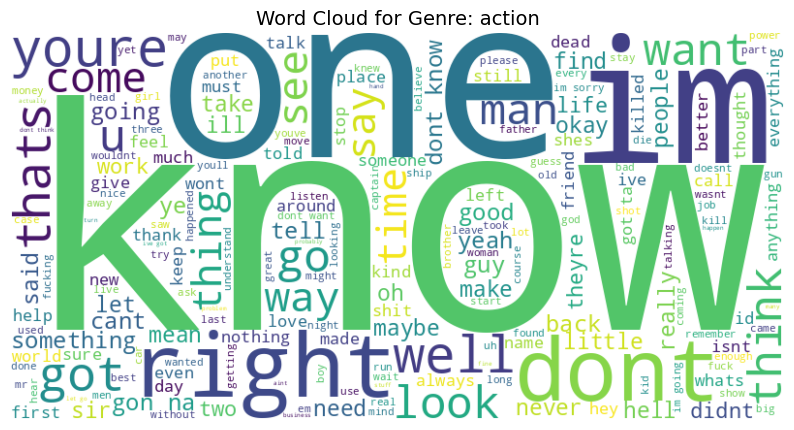

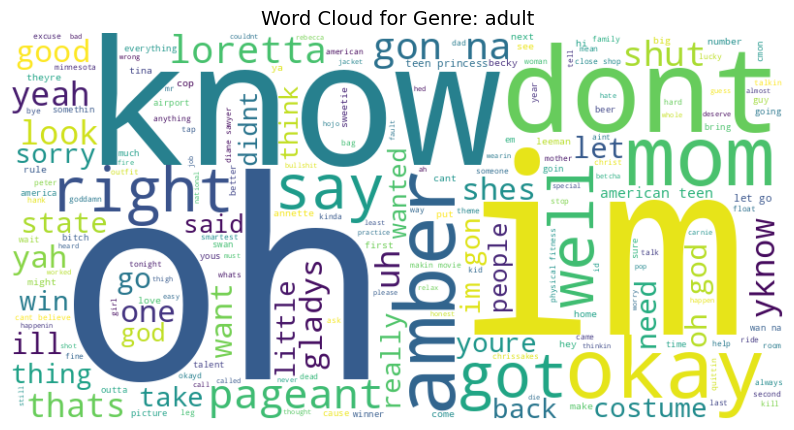

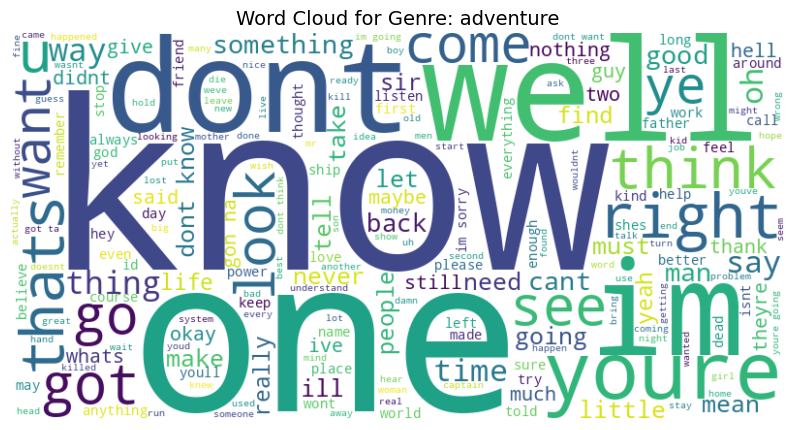

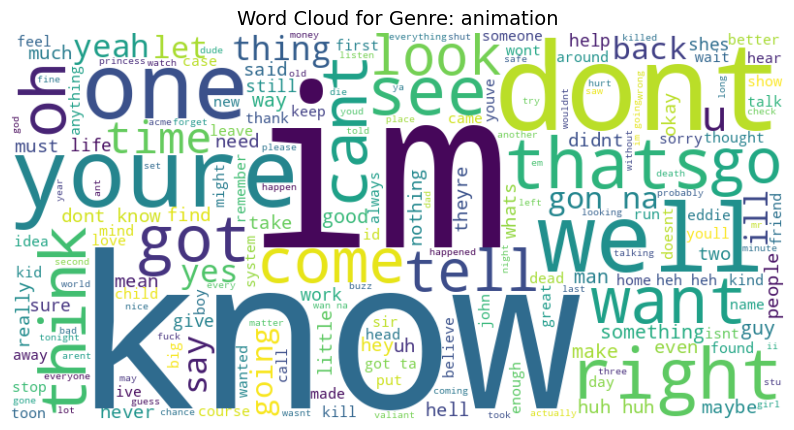

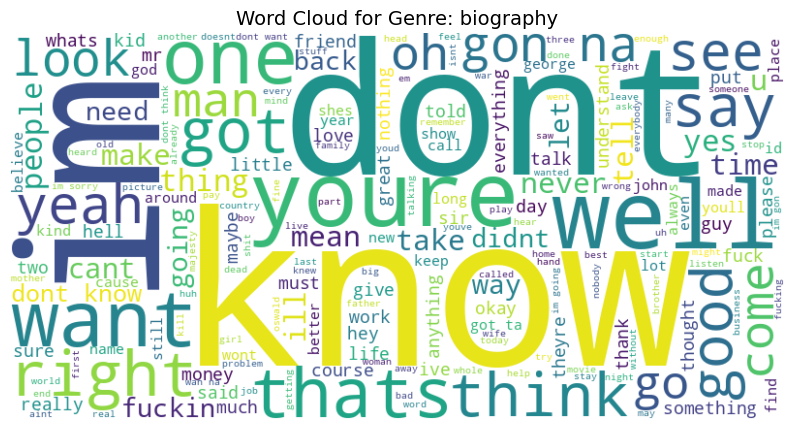

...

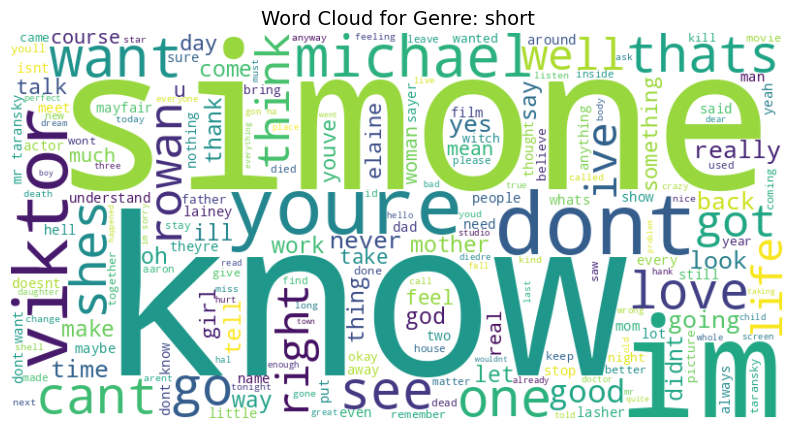

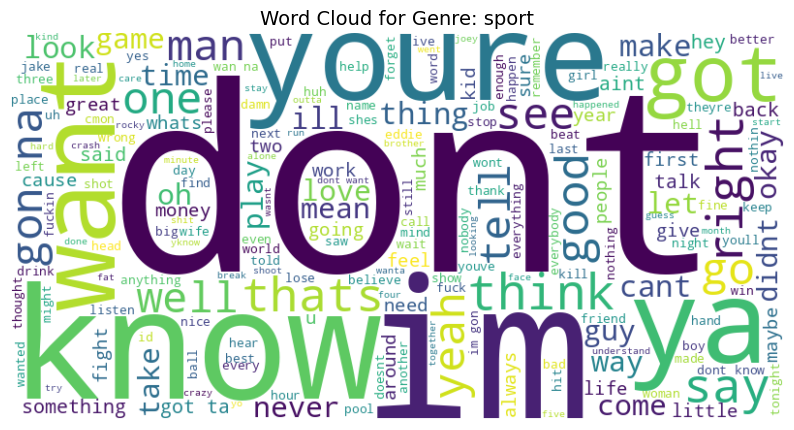

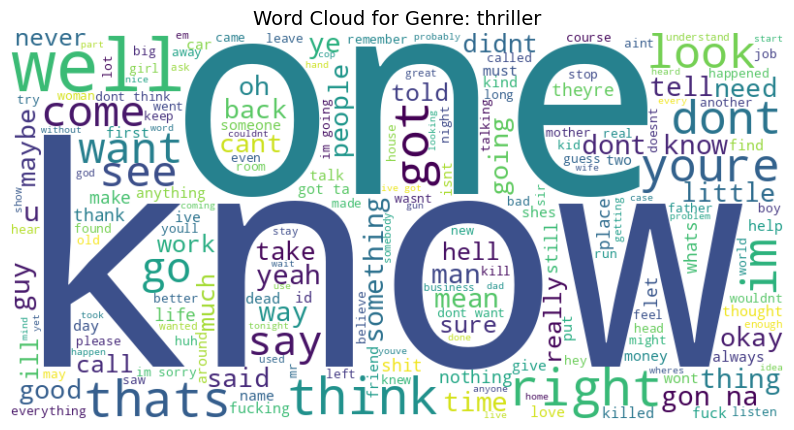

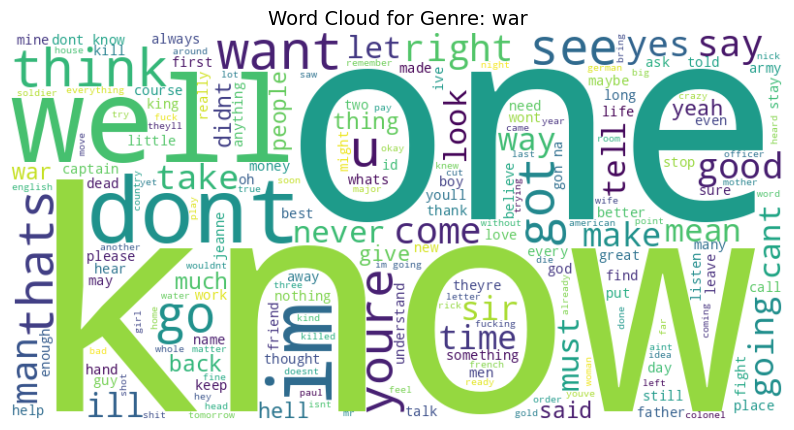

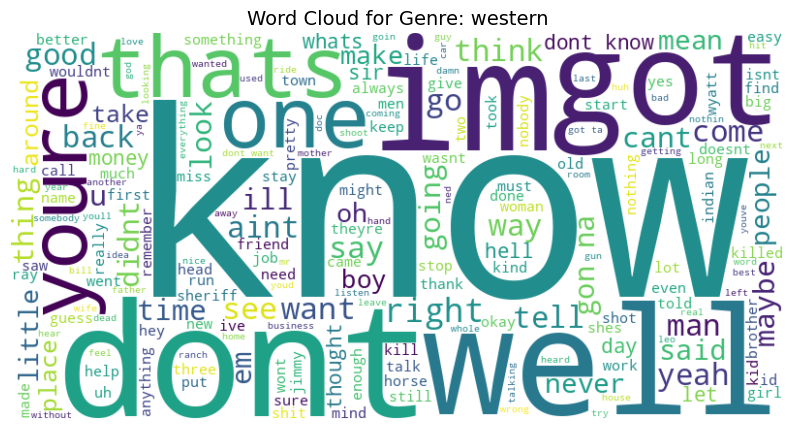

In [11]:
def generate_word_cloud(text, genre):
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text)
    plt.figure(figsize=(10, 6))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title(f'Word Cloud for Genre: {genre}', fontsize=14)
    plt.axis('off')
    plt.show()

# Generate word clouds for each genre
for index, row in genre_dialogues.iterrows():
    generate_word_cloud(row['processed_dialogue'], row['genres'])


## Data Cleaning Conclusion
The output above shows success in imputing missing entries, resulting in complete datasets without any loss of information. However, the word clouds show that each genre has similar common words. We can also see that some movie genres have few entries overall. Both situations may make finding unique differences that identify each genre difficult.


# Data Modeling and Analysis
- Now that the texts have been thinned of their insignificant words, we can convert them into feature vectors and attempt to cluster that data based on similarities. The code below will process the text using TF-IDF and Word2Vec methods, then use KMeans and DBSCAN clustering. We'll measure our success using Silhouette Score and Davies-Bouldin Index.

### Term Frequency-Inverse Document Frequency (TF-IDF):
- TF-IDF is a text data vectorization method that helps identify significant words in a specific document type. TF-IDF measures the balance between how frequently a particular word appears in a text and how infrequently that word appears in all texts. This method creates a word set that aligns with specific documents, allowing algorithms to identify documents by the prevalence of those words.

### Word Vectorization (Word2Vec):
  - Word2Vec takes the concept of simple word-to-integer mapping methods and adds a two-layer neural network to map words to vectors that are hundreds of dimensions in size. This allows Word2Vec to capture the context of words within documents and then predict the context of a document based on the presence of those words.

### KMeans Clustering:
- KMeans clustering algorithm partitions data into K clusters by minimizing the variance within each cluster. It iteratively assigns data points to the nearest cluster center and then updates cluster centers based on the mean of assigned points.

### Density-Based Spatial Clustering of Applications with Noise (DBSCAN):
- DBSCAN is a clustering algorithm that groups together data points that are closely packed and then marks points in low-density regions as outliers. It is effective at finding clusters of arbitrary shape and resistent to noisy data.

### Silhouette Score:
- A Silhouette Score is a metric used to evaluate the quality of clustering. It measures how similar a point is to its own cluster versus other clusters. Scores range from -1 to 1, with higher scores indicating more well-defined clusters.

### Davies-Bouldin Index:
- The Davies-Bouldin Index is a clustering evaluation metric that assesses the average similarity ratio of each cluster with the cluster most similar to it. Lower values indicate better clustering quality, representing less overlap between clusters.

In [12]:
# TF-IDF Vectorization
tfidf_vectorizer = TfidfVectorizer(max_features=1000)
X_tfidf = tfidf_vectorizer.fit_transform(merged_data['processed_dialogue'])


# PCA
pca = PCA(n_components=0.95)  # Choose components to explain 95% variance
X_pca = pca.fit_transform(X_tfidf.toarray())

print(f'Original shape: {X_tfidf.shape}, PCA Reduced shape: {X_pca.shape}')


Original shape: (617, 1000), PCA Reduced shape: (617, 360)


In [13]:
# Determine optimal number of clusters using silhouette score
silhouette_scores = []
K = range(2, 10)

for k in K:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init='auto')
    kmeans.fit(X_pca)
    labels = kmeans.labels_
    silhouette_scores.append(silhouette_score(X_pca, labels))

optimal_k = K[silhouette_scores.index(max(silhouette_scores))]
print(f'Optimal number of clusters: {optimal_k}')

# Final K-Means clustering
kmeans = KMeans(n_clusters=optimal_k, random_state=42, n_init='auto')
kmeans.fit(X_pca)
kmeans_labels = kmeans.labels_


Optimal number of clusters: 2


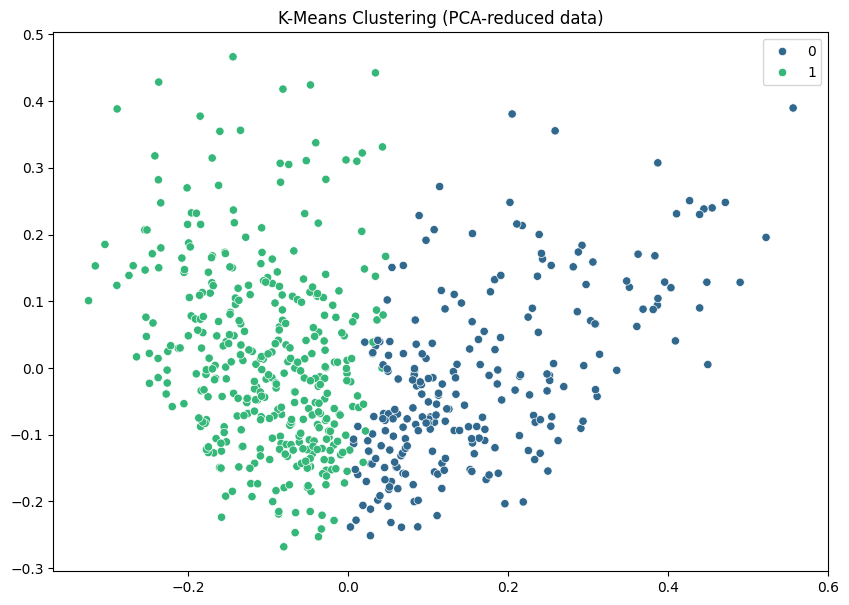

In [14]:
# 2D Scatter plot
plt.figure(figsize=(10, 7))
sns.scatterplot(x=X_pca[:, 0], y=X_pca[:, 1], hue=kmeans_labels, palette="viridis")
plt.title('K-Means Clustering (PCA-reduced data)')
plt.show()

# Add cluster labels to merged_data
merged_data['cluster'] = kmeans_labels

In [15]:
# Cluster interpretation
cluster_genres = merged_data.groupby('cluster')['genres'].apply(lambda x: x.explode().value_counts().head(5))
print(cluster_genres)


cluster           
0        drama        119
         thriller      90
         adventure     66
         sci-fi        64
         action        63
1        drama        201
         thriller     179
         crime        118
         comedy       115
         action       105
Name: genres, dtype: int64


In [16]:
# Internal Validation
silhouette_avg = silhouette_score(X_pca, kmeans_labels)
db_index = davies_bouldin_score(X_pca, kmeans_labels)

print(f'Silhouette Score: {silhouette_avg}')
print(f'Davies-Bouldin Index: {db_index}')


Silhouette Score: 0.05043835775760102
Davies-Bouldin Index: 5.05567542885867


These are not excellent scores initially; two clusters won't capture the number of genres in the data. Let's try Word2Vec tokenization.

In [17]:
# Tokenize dialogues for Word2Vec
dialogue_tokens = dialogue['processed_dialogue'].apply(word_tokenize)

# Train Word2Vec model
w2v_model = Word2Vec(sentences=dialogue_tokens, vector_size=100, window=5, min_count=5, workers=4)

# Function to create document vectors by averaging word vectors
def document_vector(doc):
    doc = [word for word in doc if word in w2v_model.wv]
    return np.mean(w2v_model.wv[doc], axis=0)

# Create document vectors for each movie
movie_dialogues['w2v_vector'] = movie_dialogues['processed_dialogue'].apply(lambda x: document_vector(word_tokenize(x)))

# Create a feature matrix from word vectors
X_w2v = np.vstack(movie_dialogues['w2v_vector'].to_numpy())

print(X_w2v.shape)


(617, 100)


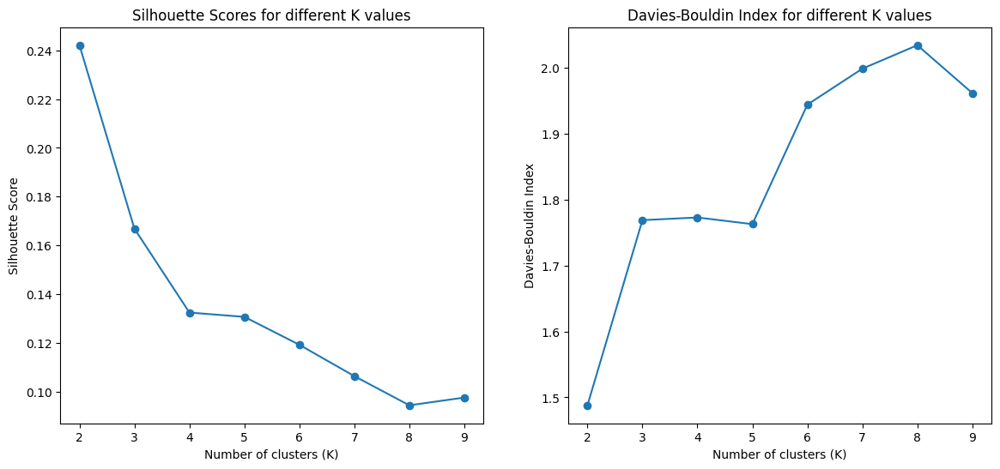

In [18]:
# Perform K-Means clustering on Word2Vec
silhouette_scores = []
db_indices = []
K = range(2, 10)

for k in K:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init='auto')
    kmeans.fit(X_w2v)
    labels = kmeans.labels_
    silhouette_scores.append(silhouette_score(X_w2v, labels))
    db_indices.append(davies_bouldin_score(X_w2v, labels))

# Plot silhouette scores and Davies-Bouldin indices
plt.figure(figsize=(14, 6))
plt.subplot(1, 2, 1)
plt.plot(K, silhouette_scores, marker='o')
plt.title('Silhouette Scores for different K values')
plt.xlabel('Number of clusters (K)')
plt.ylabel('Silhouette Score')

plt.subplot(1, 2, 2)
plt.plot(K, db_indices, marker='o')
plt.title('Davies-Bouldin Index for different K values')
plt.xlabel('Number of clusters (K)')
plt.ylabel('Davies-Bouldin Index')

plt.show()


Let's try DBSCAN clustering on our Word2Vec data.

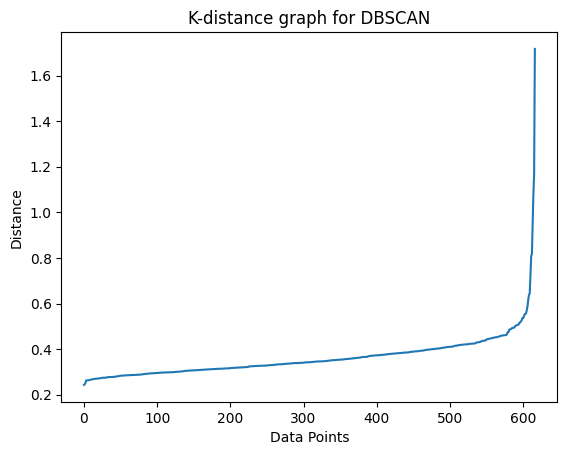

DBSCAN Silhouette Score: 0.453490674495697
DBSCAN Davies-Bouldin Index: 4.456674271721269


In [19]:
# Find the optimal eps value using the k-distance graph
neighbors = NearestNeighbors(n_neighbors=5)
neighbors_fit = neighbors.fit(X_w2v)
distances, indices = neighbors_fit.kneighbors(X_w2v)

# Sort and plot distances to find the elbow point
distances = np.sort(distances[:, 4], axis=0)
plt.plot(distances)
plt.title('K-distance graph for DBSCAN')
plt.xlabel('Data Points')
plt.ylabel('Distance')
plt.show()

# Apply DBSCAN with tuned parameters
dbscan = DBSCAN(eps=0.5, min_samples=5)
dbscan_labels = dbscan.fit_predict(X_w2v)

# Evaluate DBSCAN clustering
dbscan_silhouette = silhouette_score(X_w2v, dbscan_labels)
dbscan_db_index = davies_bouldin_score(X_w2v, dbscan_labels)

print(f'DBSCAN Silhouette Score: {dbscan_silhouette}')
print(f'DBSCAN Davies-Bouldin Index: {dbscan_db_index}')


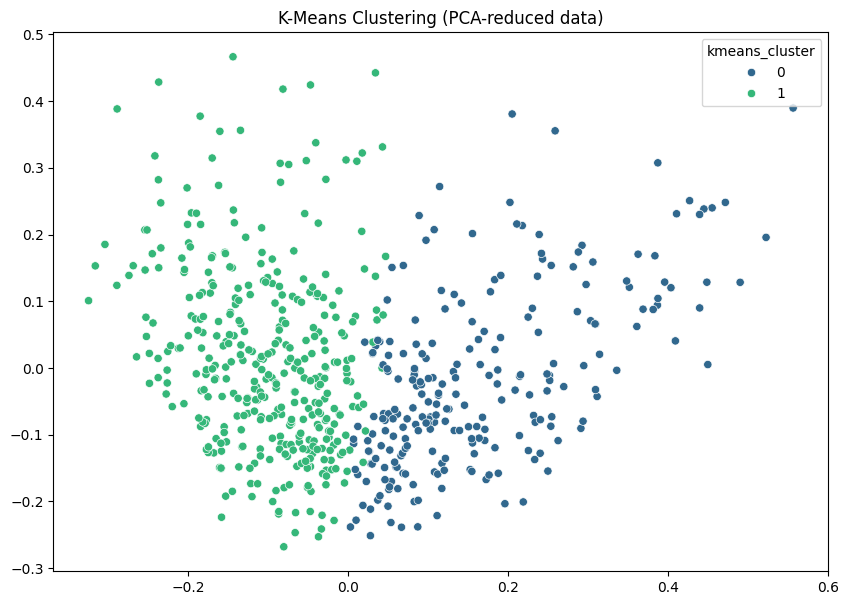

dbscan_cluster          
-1              drama         6
                thriller      4
                comedy        3
                horror        3
                action        3
 0              drama       314
                thriller    265
                action      165
                comedy      159
                crime       144
Name: genres, dtype: int64
K=2: Silhouette Score=0.24210618436336517, Davies-Bouldin Index=1.487988706463941
K=3: Silhouette Score=0.1668679565191269, Davies-Bouldin Index=1.7686787116148188
K=4: Silhouette Score=0.13247305154800415, Davies-Bouldin Index=1.7727353387777307
K=5: Silhouette Score=0.13070209324359894, Davies-Bouldin Index=1.7626234426511231
K=6: Silhouette Score=0.11925411224365234, Davies-Bouldin Index=1.9438227078286172
K=7: Silhouette Score=0.10640180855989456, Davies-Bouldin Index=1.9982636168240153
K=8: Silhouette Score=0.09443028271198273, Davies-Bouldin Index=2.033871384136849
K=9: Silhouette Score=0.09760892391204834, Davies-

In [20]:
# Add cluster labels to merged_data for both K-Means and DBSCAN
merged_data['kmeans_cluster'] = kmeans_labels
merged_data['dbscan_cluster'] = dbscan_labels

# 2D Visualization using PCA for K-Means clusters
plt.figure(figsize=(10, 7))
sns.scatterplot(x=X_pca[:, 0], y=X_pca[:, 1], hue=merged_data['kmeans_cluster'], palette="viridis")
plt.title('K-Means Clustering (PCA-reduced data)')
plt.show()

# Analyze clusters to understand dominant genres or themes for DBSCAN clusters
dbscan_cluster_genres = merged_data.groupby('dbscan_cluster')['genres'].apply(lambda x: x.explode().value_counts().head(5))
print(dbscan_cluster_genres)

# Internal validation for K-Means with different clusters
for k in range(2, 10):
    kmeans = KMeans(n_clusters=k, random_state=42, n_init='auto')
    kmeans.fit(X_w2v)
    labels = kmeans.labels_
    silhouette_avg = silhouette_score(X_w2v, labels)
    db_index = davies_bouldin_score(X_w2v, labels)
    print(f'K={k}: Silhouette Score={silhouette_avg}, Davies-Bouldin Index={db_index}')


We were able to achieve an acceptable Silhouette Score, but two clusters are just not suitable for our goals.

Let's combine TF-IDF and Word2Vec methods and retest KMeans and DBSCAN clustering to see if we can improve the results.

In [21]:
best_silhouette = -1
best_params = {}

# Define parameter ranges
eps_range = np.arange(0.3, 0.8, 0.1)
min_samples_range = range(3, 10)

for eps in eps_range:
    for min_samples in min_samples_range:
        dbscan = DBSCAN(eps=eps, min_samples=min_samples)
        labels = dbscan.fit_predict(X_w2v)
        if len(set(labels)) > 1:  # Only consider valid clustering results
            silhouette_avg = silhouette_score(X_w2v, labels)
            db_index = davies_bouldin_score(X_w2v, labels)
            if silhouette_avg > best_silhouette:
                best_silhouette = silhouette_avg
                best_params = {'eps': eps, 'min_samples': min_samples}
                best_db_index = db_index

print(f'Best DBSCAN params: {best_params}, Silhouette Score: {best_silhouette}, Davies-Bouldin Index: {best_db_index}')


Best DBSCAN params: {'eps': 0.7000000000000002, 'min_samples': 3}, Silhouette Score: 0.5327277183532715, Davies-Bouldin Index: 3.2662327156385182


In [22]:
# Define the vectorizer
tfidf_vectorizer = TfidfVectorizer(max_features=10000, stop_words='english')

# Compute TF-IDF features
tfidf_features = tfidf_vectorizer.fit_transform(movie_dialogues['processed_dialogue'])
print(f'TF-IDF feature shape: {tfidf_features.shape}')


TF-IDF feature shape: (617, 10000)


In [23]:
# Combine TF-IDF and Word2Vec features
combined_features = hstack([tfidf_features, X_w2v])
print(f'Combined feature shape: {combined_features.shape}')


Combined feature shape: (617, 10100)


In [24]:
# KMeans clustering on combined features
optimal_k = 5  # Determined from previous range exploration

kmeans = KMeans(n_clusters=optimal_k, random_state=42, n_init='auto')
kmeans_labels = kmeans.fit_predict(combined_features)

kmeans_silhouette = silhouette_score(combined_features, kmeans_labels)

# Convert combined_features to dense array for Davies-Bouldin Index calculation
combined_features_dense = combined_features.toarray()
kmeans_db_index = davies_bouldin_score(combined_features_dense, kmeans_labels)

print(f'KMeans Silhouette Score: {kmeans_silhouette}')
print(f'KMeans Davies-Bouldin Index: {kmeans_db_index}')


KMeans Silhouette Score: 0.027154952056245792
KMeans Davies-Bouldin Index: 4.208713180158548


In [25]:
# DBSCAN clustering on combined features
best_eps = 0.7  # Best eps from previous optimization
best_min_samples = 3  # Best min_samples from previous optimization

dbscan = DBSCAN(eps=best_eps, min_samples=best_min_samples)
dbscan_labels = dbscan.fit_predict(combined_features)

unique_labels = len(set(dbscan_labels)) - (1 if -1 in dbscan_labels else 0)

if unique_labels > 1:
    dbscan_silhouette = silhouette_score(combined_features, dbscan_labels)
    combined_features_dense = combined_features.toarray()
    dbscan_db_index = davies_bouldin_score(combined_features_dense, dbscan_labels)

    print(f'DBSCAN (combined features) Silhouette Score: {dbscan_silhouette}')
    print(f'DBSCAN (combined features) Davies-Bouldin Index: {dbscan_db_index}')
else:
    print(f'DBSCAN failed to produce sufficient clusters. Number of clusters: {unique_labels}')


DBSCAN failed to produce sufficient clusters. Number of clusters: 0


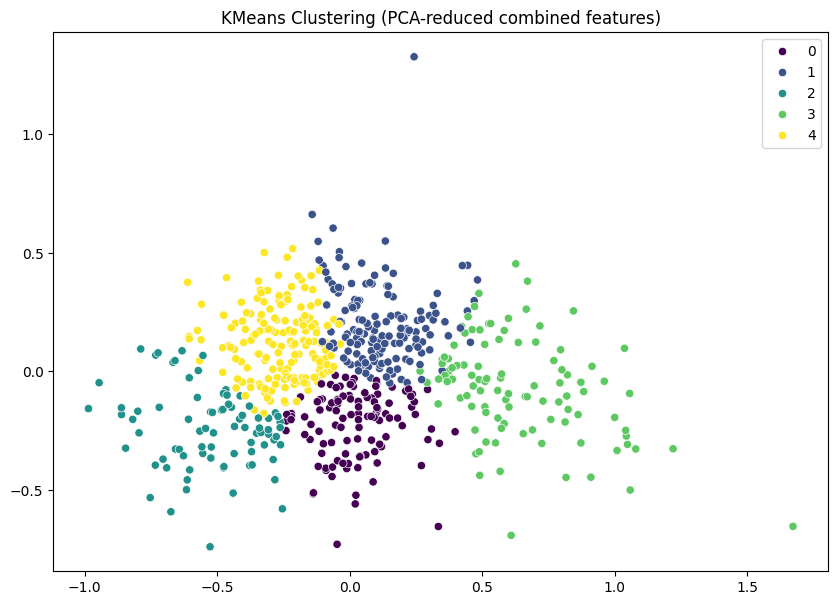

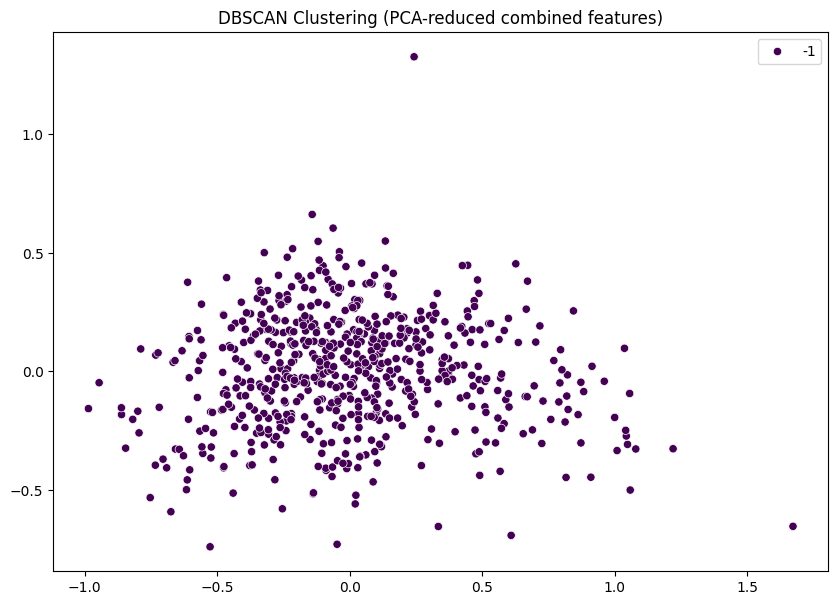

In [26]:
# 2D visualization using PCA
pca = PCA(n_components=2)
reduced_features = pca.fit_transform(combined_features.toarray())

# Visualize KMeans clusters
plt.figure(figsize=(10, 7))
sns.scatterplot(x=reduced_features[:, 0], y=reduced_features[:, 1], hue=kmeans_labels, palette="viridis")
plt.title('KMeans Clustering (PCA-reduced combined features)')
plt.show()

# Visualize DBSCAN clusters
plt.figure(figsize=(10, 7))
sns.scatterplot(x=reduced_features[:, 0], y=reduced_features[:, 1], hue=dbscan_labels, palette="viridis")
plt.title('DBSCAN Clustering (PCA-reduced combined features)')
plt.show()


In [27]:
# Analyze KMeans clusters
merged_data['kmeans_cluster'] = kmeans_labels
kmeans_cluster_genres = merged_data.groupby('kmeans_cluster')['genres'].apply(lambda x: x.explode().value_counts().head(5))
print(kmeans_cluster_genres)

# Analyze DBSCAN clusters
merged_data['dbscan_cluster'] = dbscan_labels
dbscan_cluster_genres = merged_data.groupby('dbscan_cluster')['genres'].apply(lambda x: x.explode().value_counts().head(5))
print(dbscan_cluster_genres)


kmeans_cluster           
0               drama        56
                thriller     49
                action       38
                crime        33
                comedy       28
1               drama        84
                thriller     66
                comedy       45
                action       38
                crime        38
2               drama        41
                thriller     35
                sci-fi       24
                action       22
                comedy       21
3               drama        48
                thriller     46
                action       30
                comedy       28
                adventure    23
4               drama        91
                thriller     73
                comedy       40
                romance      40
                action       40
Name: genres, dtype: int64
dbscan_cluster  -1      
-1              drama       320
                thriller    269
                action      168
                comedy    

This time, DBSCAN provided even more promising Silhouette Scores, but ultimately failed in producing meaningful clusters for the data.
KMeans clustering looked good visually, but the low Silhouette Score indicates poor clustering.

Let's visualize some parameters to try and find a good solution.

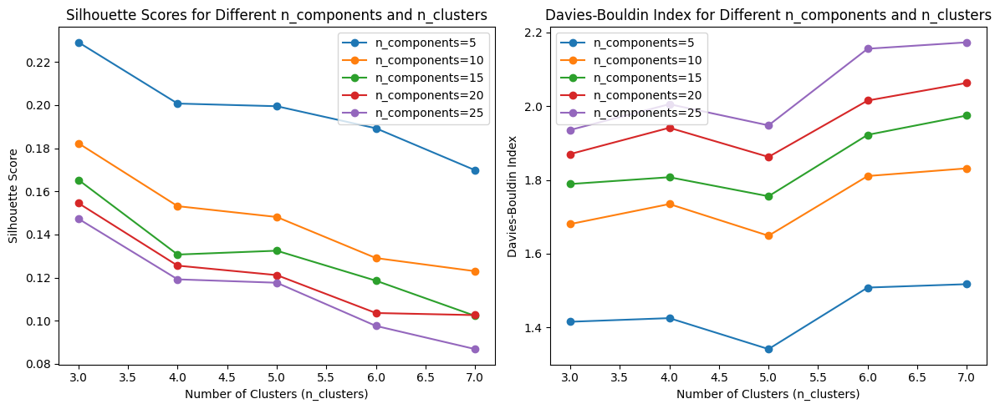

In [28]:
# Initialize lists to store results
silhouette_scores = []
davies_bouldin_scores = []
n_components_list = []
n_clusters_list = []

# Define ranges for n_components and n_clusters
n_components_range = [5, 10, 15, 20, 25]
n_clusters_range = [3, 4, 5, 6, 7]

# Iterate through combinations
for n_components in n_components_range:
    # Apply PCA to reduce dimensionality
    pca = PCA(n_components=n_components, random_state=42)
    reduced_features = pca.fit_transform(combined_features_dense)

    for n_clusters in n_clusters_range:
        # Perform KMeans clustering on reduced features
        kmeans = KMeans(n_clusters=n_clusters, random_state=42, n_init='auto')
        kmeans_labels = kmeans.fit_predict(reduced_features)

        # Evaluate the clustering
        kmeans_silhouette = silhouette_score(reduced_features, kmeans_labels)
        kmeans_db_index = davies_bouldin_score(reduced_features, kmeans_labels)

        # Store results
        silhouette_scores.append(kmeans_silhouette)
        davies_bouldin_scores.append(kmeans_db_index)
        n_components_list.append(n_components)
        n_clusters_list.append(n_clusters)

# Convert lists to numpy arrays for plotting
silhouette_scores = np.array(silhouette_scores)
davies_bouldin_scores = np.array(davies_bouldin_scores)
n_components_list = np.array(n_components_list)
n_clusters_list = np.array(n_clusters_list)

# Reshape for plotting
silhouette_scores_grid = silhouette_scores.reshape(len(n_components_range), len(n_clusters_range))
davies_bouldin_scores_grid = davies_bouldin_scores.reshape(len(n_components_range), len(n_clusters_range))

# Plotting
plt.figure(figsize=(12, 5))

# Plot Silhouette scores
plt.subplot(1, 2, 1)
for i, n_components in enumerate(n_components_range):
    plt.plot(n_clusters_range, silhouette_scores_grid[i], marker='o', label=f'n_components={n_components}')
plt.title('Silhouette Scores for Different n_components and n_clusters')
plt.xlabel('Number of Clusters (n_clusters)')
plt.ylabel('Silhouette Score')
plt.legend()

# Plot Davies-Bouldin scores
plt.subplot(1, 2, 2)
for i, n_components in enumerate(n_components_range):
    plt.plot(n_clusters_range, davies_bouldin_scores_grid[i], marker='o', label=f'n_components={n_components}')
plt.title('Davies-Bouldin Index for Different n_components and n_clusters')
plt.xlabel('Number of Clusters (n_clusters)')
plt.ylabel('Davies-Bouldin Index')
plt.legend()

plt.tight_layout()
plt.show()


Although we get the highest Silhouette Score with only 3 clusters, 5 clusters provide the best Davies-Bouldin Index while giving a healthy Silhouette Score.

Let's process our data with 5 clusters and 5 PCA components.

We'll start with a fresh intake of the data and skip the TF-IDF and Word2Vec tokenization to see if we get better results.

In [29]:

# Define URLs of the files
metadata_url = 'https://raw.githubusercontent.com/dstephenhaynes/DTSA5510/main/movie_titles_metadata.txt'
dialogue_urls = [
    'https://raw.githubusercontent.com/dstephenhaynes/DTSA5510/main/movie_lines_1.txt',
    'https://raw.githubusercontent.com/dstephenhaynes/DTSA5510/main/movie_lines_2.txt'
]

# Load movie metadata
response = requests.get(metadata_url)
data = response.text
columns = ['movie_id', 'movie_title', 'movie_year', 'imdb_rating', 'imdb_id', 'genres']
rows = []

for line in data.splitlines():
    fields = line.strip().split(' +++$+++ ')
    fields[-1] = eval(fields[-1])
    rows.append(fields)

movies = pd.DataFrame(rows, columns=columns)

# Load dialogues
dialogue_rows = []
dialogue_columns = ['line_id', 'character_id', 'movie_id', 'character_name', 'dialogue']

for url in dialogue_urls:
    response = requests.get(url)
    data = response.text
    for line in data.splitlines():
        fields = line.strip().split(' +++$+++ ')
        dialogue_rows.append(fields)

dialogue = pd.DataFrame(dialogue_rows, columns=dialogue_columns)

# Remove null values
dialogue.dropna(subset=['dialogue'], inplace=True)

# Normalize text: convert to lowercase, remove punctuation
def normalize_text(text):
    text = text.lower()
    text = re.sub(f"[{re.escape(string.punctuation)}]", "", text)
    return text

dialogue['clean_dialogue'] = dialogue['dialogue'].apply(normalize_text)

# Remove stop words, tokenize, and lemmatize
stop_words = set(stopwords.words('english'))
lemmatizer = WordNetLemmatizer()

def preprocess_text(text):
    words = word_tokenize(text)
    words = [lemmatizer.lemmatize(word) for word in words if word not in stop_words]
    return ' '.join(words)

dialogue['processed_dialogue'] = dialogue['clean_dialogue'].apply(preprocess_text)

# Merge with movie metadata
merged_data = pd.merge(movies, dialogue, on='movie_id', how='inner')

# Multi-label binarization of genres
mlb = MultiLabelBinarizer()
genre_labels = mlb.fit_transform(merged_data['genres'])
genre_columns = mlb.classes_

# Apply PCA directly on genre labels
pca = PCA(n_components=5, random_state=42)
reduced_features = pca.fit_transform(genre_labels)

# Perform KMeans clustering on reduced features
kmeans = KMeans(n_clusters=n_clusters, random_state=42, n_init='auto')
kmeans_labels = kmeans.fit_predict(reduced_features)

# Assign cluster labels to merged_data
merged_data['cluster_label'] = kmeans_labels

# Print cluster labels and other relevant information
print(merged_data[['movie_title', 'genres', 'processed_dialogue', 'cluster_label']].head())

# Print the explained variance ratio by PCA components
print(f"Explained Variance Ratio by PCA Components: {pca.explained_variance_ratio_}")

# Print the centroids of the clusters
print("Centroids:")
centroids = pca.inverse_transform(kmeans.cluster_centers_)
for i, centroid in enumerate(centroids):
    top_genres = [genre_columns[ind] for ind in centroid.argsort()[:-5 - 1:-1]]
    print(f"Cluster {i}: {', '.join(top_genres)}")

# Evaluate clustering performance using silhouette score
silhouette_score_value = silhouette_score(reduced_features, kmeans_labels)
print(f"Silhouette Score: {silhouette_score_value:.4f}")


                  movie_title             genres processed_dialogue  \
0  10 things i hate about you  [comedy, romance]                      
1  10 things i hate about you  [comedy, romance]                      
2  10 things i hate about you  [comedy, romance]               hope   
3  10 things i hate about you  [comedy, romance]               okay   
4  10 things i hate about you  [comedy, romance]             let go   

   cluster_label  
0              3  
1              3  
2              3  
3              3  
4              3  
Explained Variance Ratio by PCA Components: [0.21470225 0.15805409 0.11239259 0.0935784  0.07325944]
Centroids:
Cluster 0: thriller, mystery, horror, drama, sci-fi
Cluster 1: drama, comedy, biography, crime, war
Cluster 2: drama, thriller, crime, action, mystery
Cluster 3: romance, drama, comedy, fantasy, thriller
Cluster 4: comedy, crime, horror, action, adventure
Cluster 5: action, adventure, sci-fi, thriller, fantasy
Cluster 6: thriller, crime, action,

In [30]:
# Analyze KMeans clusters
kmeans_cluster_genres = merged_data.groupby('cluster_label')['genres'].apply(lambda x: x.explode().value_counts().head(5))
print(kmeans_cluster_genres)

cluster_label           
0              thriller     38495
               horror       25921
               mystery      25674
               drama        15955
               sci-fi       10544
1              drama        70320
               comedy       18992
               biography    10697
               crime         8209
               war           6607
2              thriller     35970
               drama        35771
               crime        29217
               action       11351
               mystery       8499
3              romance      61514
               drama        47787
               comedy       32345
               fantasy       5505
               mystery       3892
4              comedy       29305
               crime         8324
               adventure     5810
               action        5783
               horror        5404
5              action       37306
               adventure    31822
               sci-fi       25700
               thriller

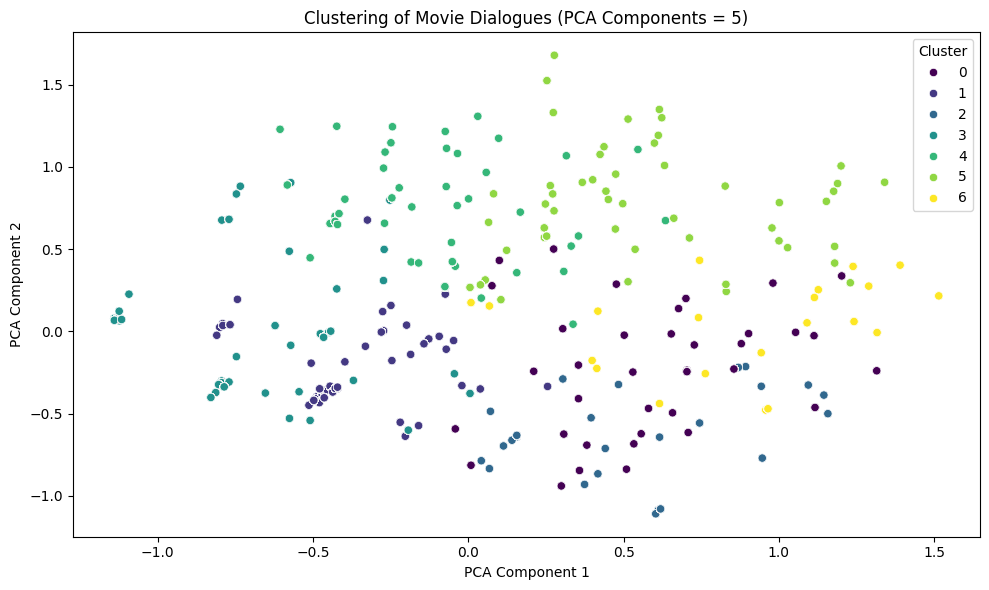

In [31]:
# Visualize clusters in 2D using PCA components
plt.figure(figsize=(10, 6))
sns.scatterplot(x=reduced_features[:, 0], y=reduced_features[:, 1], hue=kmeans_labels, palette='viridis', legend='full')
plt.title('Clustering of Movie Dialogues (PCA Components = 5)')
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.legend(title='Cluster')
plt.tight_layout()
plt.show()


That gave us a Silhouette Score of .36 and some obvious clustering, which is the best we've seen so far, but there seems to be a lot of overlap in the clusters.

Let's iterate through the options to find the best parameters.

In [32]:
# Assuming combined_features_dense is a NumPy array containing both X and y_true
X = combined_features_dense[:, :-1]  # Assuming last column is y_true
y_true = combined_features_dense[:, -1]  # Extracting y_true

# Range of n_components and n_clusters to evaluate
n_components_range = range(2, 10)
n_clusters_range = range(3, 10)

best_score = -1
best_params = {}

for n_components in n_components_range:
    for n_clusters in n_clusters_range:
        # Apply PCA
        pca = PCA(n_components=n_components, random_state=42)
        reduced_features = pca.fit_transform(X)

        # Perform KMeans clustering
        kmeans = KMeans(n_clusters=n_clusters, random_state=42, n_init='auto')
        kmeans_labels = kmeans.fit_predict(reduced_features)

        # Evaluate clustering performance using silhouette score
        silhouette_avg = silhouette_score(reduced_features, kmeans_labels)

        print(f"PCA Components: {n_components}, KMeans Clusters: {n_clusters}")
        print(f"Silhouette Score: {silhouette_avg:.4f}")

        if silhouette_avg > best_score:
            best_score = silhouette_avg
            best_params = {'n_components': n_components, 'n_clusters': n_clusters}

# Use the best parameters found
n_components = best_params['n_components']
n_clusters = best_params['n_clusters']

# Apply PCA with the best n_components
pca = PCA(n_components=n_components, random_state=42)
reduced_features = pca.fit_transform(X)

# Perform KMeans clustering with the best n_clusters
kmeans = KMeans(n_clusters=n_clusters, random_state=42, n_init='auto')
kmeans_labels = kmeans.fit_predict(reduced_features)

print(f"\nBest Parameters:")
print(f"PCA Components: {n_components}, KMeans Clusters: {n_clusters}")

PCA Components: 2, KMeans Clusters: 3
Silhouette Score: 0.3393
PCA Components: 2, KMeans Clusters: 4
Silhouette Score: 0.3370
PCA Components: 2, KMeans Clusters: 5
Silhouette Score: 0.3507
PCA Components: 2, KMeans Clusters: 6
Silhouette Score: 0.3301
PCA Components: 2, KMeans Clusters: 7
Silhouette Score: 0.3312
PCA Components: 2, KMeans Clusters: 8
Silhouette Score: 0.3448
PCA Components: 2, KMeans Clusters: 9
Silhouette Score: 0.3413
PCA Components: 3, KMeans Clusters: 3
Silhouette Score: 0.2813
PCA Components: 3, KMeans Clusters: 4
Silhouette Score: 0.2584
PCA Components: 3, KMeans Clusters: 5
Silhouette Score: 0.2634
PCA Components: 3, KMeans Clusters: 6
Silhouette Score: 0.2466
PCA Components: 3, KMeans Clusters: 7
Silhouette Score: 0.2372
PCA Components: 3, KMeans Clusters: 8
Silhouette Score: 0.2385
PCA Components: 3, KMeans Clusters: 9
Silhouette Score: 0.2297
PCA Components: 4, KMeans Clusters: 3
Silhouette Score: 0.2492
PCA Components: 4, KMeans Clusters: 4
Silhouette Score:

It looks like 2 PCA Components and 5 Clusters should get us a better result.

We'll remodel from scratch again, this time using the suggested best parameters.

In [33]:
# Define URLs of the files
metadata_url = 'https://raw.githubusercontent.com/dstephenhaynes/DTSA5510/main/movie_titles_metadata.txt'
dialogue_urls = [
    'https://raw.githubusercontent.com/dstephenhaynes/DTSA5510/main/movie_lines_1.txt',
    'https://raw.githubusercontent.com/dstephenhaynes/DTSA5510/main/movie_lines_2.txt'
]

# Load movie metadata
response = requests.get(metadata_url)
data = response.text
columns = ['movie_id', 'movie_title', 'movie_year', 'imdb_rating', 'imdb_id', 'genres']
rows = []

for line in data.splitlines():
    fields = line.strip().split(' +++$+++ ')
    fields[-1] = eval(fields[-1])
    rows.append(fields)

movies = pd.DataFrame(rows, columns=columns)

# Load dialogues
dialogue_rows = []
dialogue_columns = ['line_id', 'character_id', 'movie_id', 'character_name', 'dialogue']

for url in dialogue_urls:
    response = requests.get(url)
    data = response.text
    for line in data.splitlines():
        fields = line.strip().split(' +++$+++ ')
        dialogue_rows.append(fields)

dialogue = pd.DataFrame(dialogue_rows, columns=dialogue_columns)

# Remove null values
dialogue.dropna(subset=['dialogue'], inplace=True)

# Normalize text: convert to lowercase, remove punctuation
def normalize_text(text):
    text = text.lower()
    text = re.sub(f"[{re.escape(string.punctuation)}]", "", text)
    return text

dialogue['clean_dialogue'] = dialogue['dialogue'].apply(normalize_text)

# Remove stop words, tokenize, and lemmatize
stop_words = set(stopwords.words('english'))
lemmatizer = WordNetLemmatizer()

def preprocess_text(text):
    words = word_tokenize(text)
    words = [lemmatizer.lemmatize(word) for word in words if word not in stop_words]
    return ' '.join(words)

dialogue['processed_dialogue'] = dialogue['clean_dialogue'].apply(preprocess_text)

# Merge with movie metadata
merged_data = pd.merge(movies, dialogue, on='movie_id', how='inner')

# Multi-label binarization of genres
mlb = MultiLabelBinarizer()
genre_labels = mlb.fit_transform(merged_data['genres'])
genre_columns = mlb.classes_

# Apply PCA directly on genre labels
pca = PCA(n_components, random_state=42)
reduced_features = pca.fit_transform(genre_labels)

# Perform KMeans clustering on reduced features
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
kmeans_labels = kmeans.fit_predict(reduced_features)

# Assign cluster labels to merged_data
merged_data['cluster_label'] = kmeans_labels

# Print cluster labels and other relevant information
print(merged_data[['movie_title', 'genres', 'processed_dialogue', 'cluster_label']].head())

# Print the explained variance ratio by PCA components
print(f"Explained Variance Ratio by PCA Components: {pca.explained_variance_ratio_}")

# Print the centroids of the clusters
print("Centroids:")
centroids = pca.inverse_transform(kmeans.cluster_centers_)
for i, centroid in enumerate(centroids):
    top_genres = [genre_columns[ind] for ind in centroid.argsort()[:-5 - 1:-1]]
    print(f"Cluster {i}: {', '.join(top_genres)}")

# Evaluate clustering performance using silhouette score
silhouette_score_value = silhouette_score(reduced_features, kmeans_labels)
print(f"Silhouette Score: {silhouette_score_value:.4f}")


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


                  movie_title             genres processed_dialogue  \
0  10 things i hate about you  [comedy, romance]                      
1  10 things i hate about you  [comedy, romance]                      
2  10 things i hate about you  [comedy, romance]               hope   
3  10 things i hate about you  [comedy, romance]               okay   
4  10 things i hate about you  [comedy, romance]             let go   

   cluster_label  
0              3  
1              3  
2              3  
3              3  
4              3  
Explained Variance Ratio by PCA Components: [0.21470225 0.15805409]
Centroids:
Cluster 0: drama, thriller, crime, mystery, horror
Cluster 1: drama, romance, comedy, crime, biography
Cluster 2: action, thriller, adventure, sci-fi, comedy
Cluster 3: comedy, romance, action, drama, adventure
Cluster 4: thriller, crime, action, drama, mystery
Silhouette Score: 0.4482


In [34]:
# Analyze KMeans clusters
kmeans_cluster_genres = merged_data.groupby('cluster_label')['genres'].apply(lambda x: x.explode().value_counts().head(5))
print(kmeans_cluster_genres)

cluster_label           
0              drama         53238
               thriller      43711
               crime         28040
               mystery       18429
               romance        5840
1              drama        101987
               romance       43757
               comedy        38230
               biography     10156
               war            8242
2              action        36140
               adventure     31398
               sci-fi        24180
               thriller      19212
               fantasy       10392
3              comedy        42296
               romance       21372
               adventure      9893
               crime          9393
               horror         8337
4              thriller      56144
               crime         30936
               mystery       24525
               action        22214
               horror        17011
Name: genres, dtype: int64


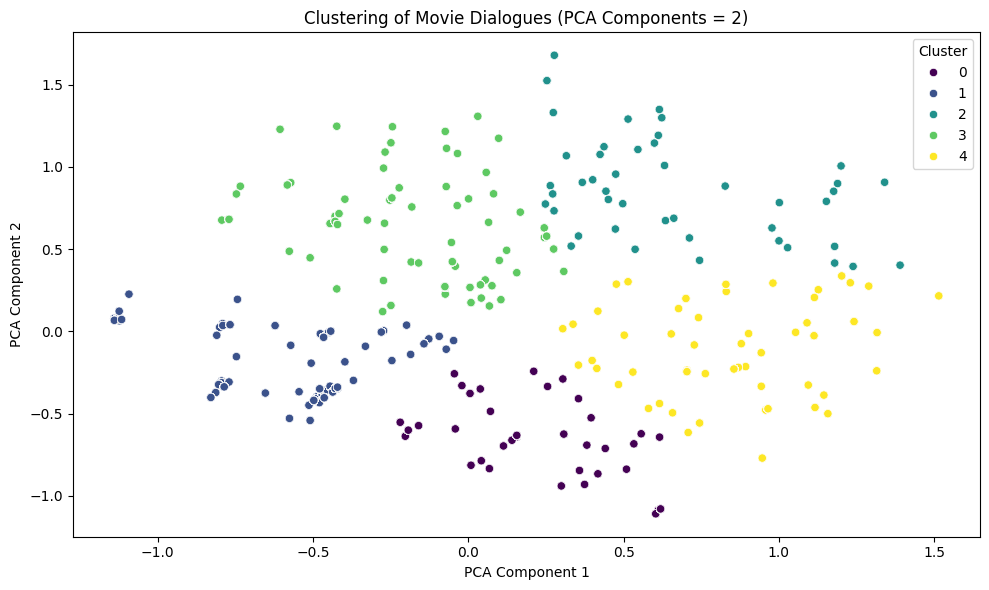

In [35]:
# Visualize clusters in 2D using PCA components
plt.figure(figsize=(10, 6))
sns.scatterplot(x=reduced_features[:, 0], y=reduced_features[:, 1], hue=kmeans_labels, palette='viridis', legend='full')
plt.title('Clustering of Movie Dialogues (PCA Components = 2)')
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.legend(title='Cluster')
plt.tight_layout()
plt.show()


# Results and Conclusion

## Results
- In the end, we achieved a respectable .44 Silhouette Score using KMeans Clustering with 5 clusters and a PCA component count of 2. Although our last visualization shows good separation, the clusters are not as tight as in previous attempts.

- Why did a PCA of 2 work better than 5? PCA reduces the dimensionality of data by focusing on the principal components that capture the most variance. This is The more significant gaps between each data point in the scatterplot show that a lower PCA component count also reduces the overall noise in the data, resulting in cleaner, more apparent clusters.


## Conclusion
- Although we could not create a 1 to 1 ratio of clusters and genres, we achieved focused groupings of genres based on dialogue text. With a more robust dataset and continued model exploration, creating a model that can classify movie genres based simply on their dialogue may be possible.